In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
#%matplotlib agg
#%matplotlib agg
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
#plt.ioff()

importing Jupyter notebook from Exploratory_Data_Analysis.ipynb


C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning: findfont: Font family ['normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))
C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning: find

(26000, 3)


<Figure size 1152x720 with 0 Axes>

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\Users\azarguit\Anaconda3\lib\site-packages\matplotlib\font_manager.py:1328: UserWarning:

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans

C:\U

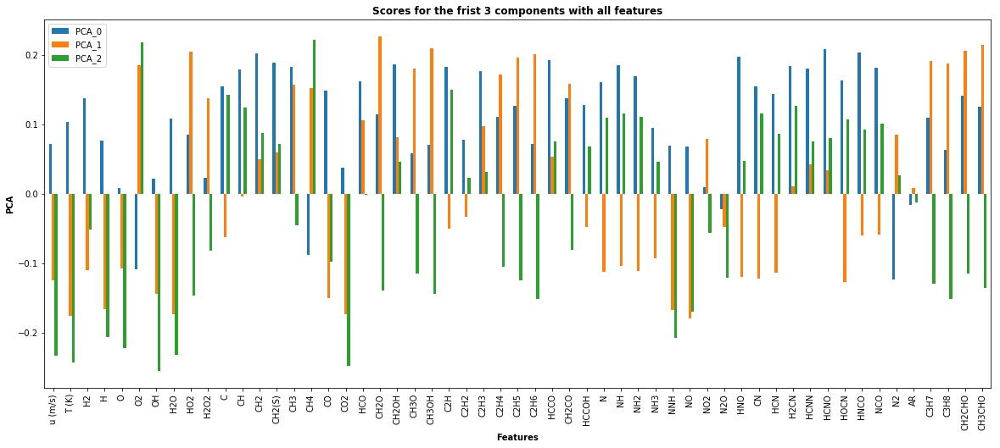

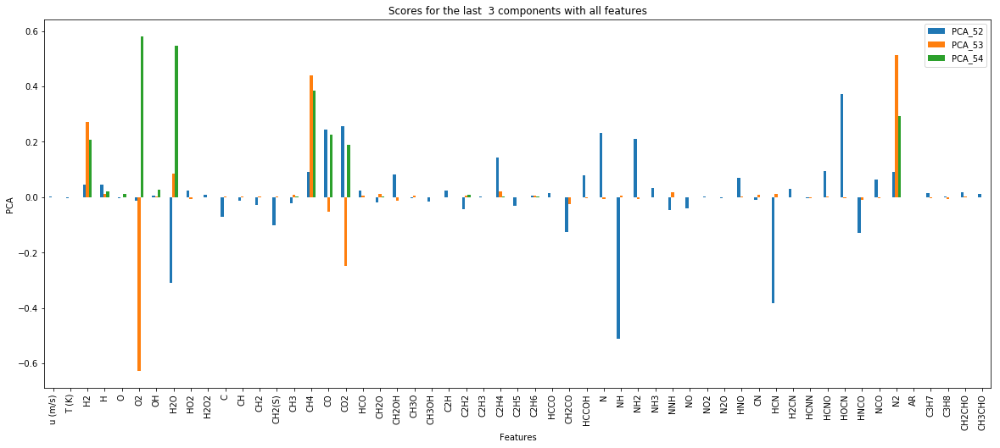

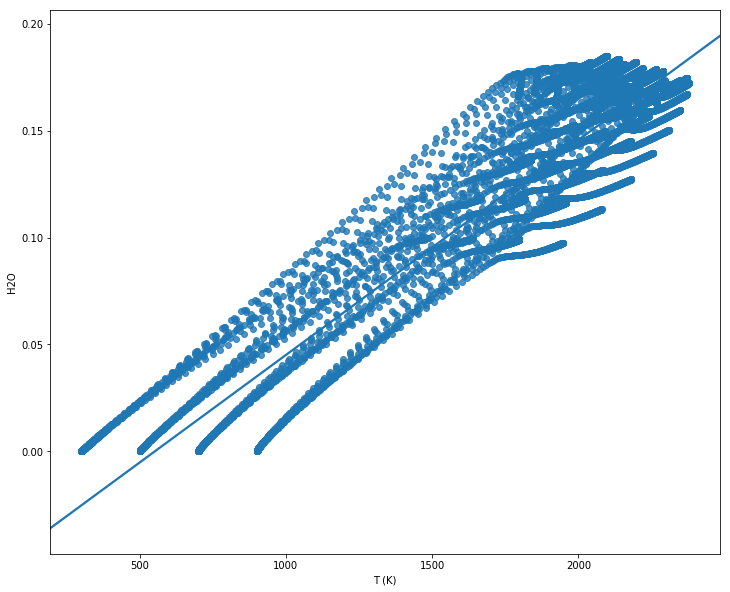

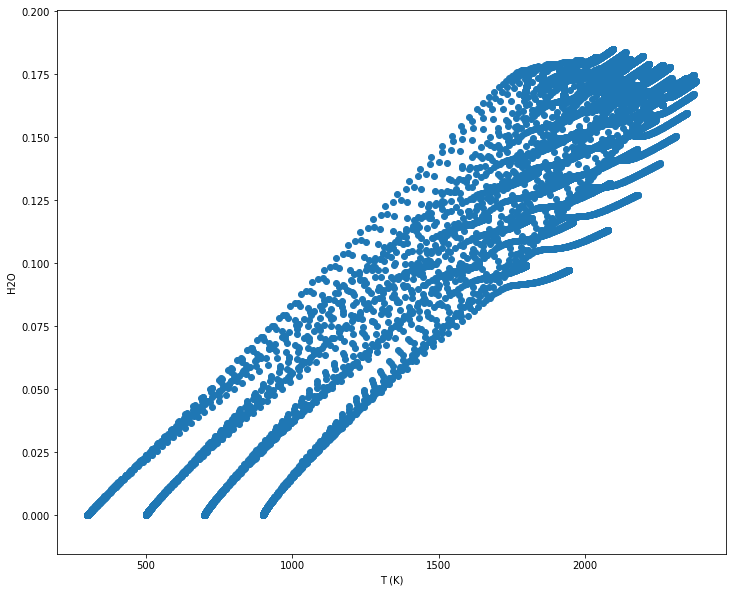

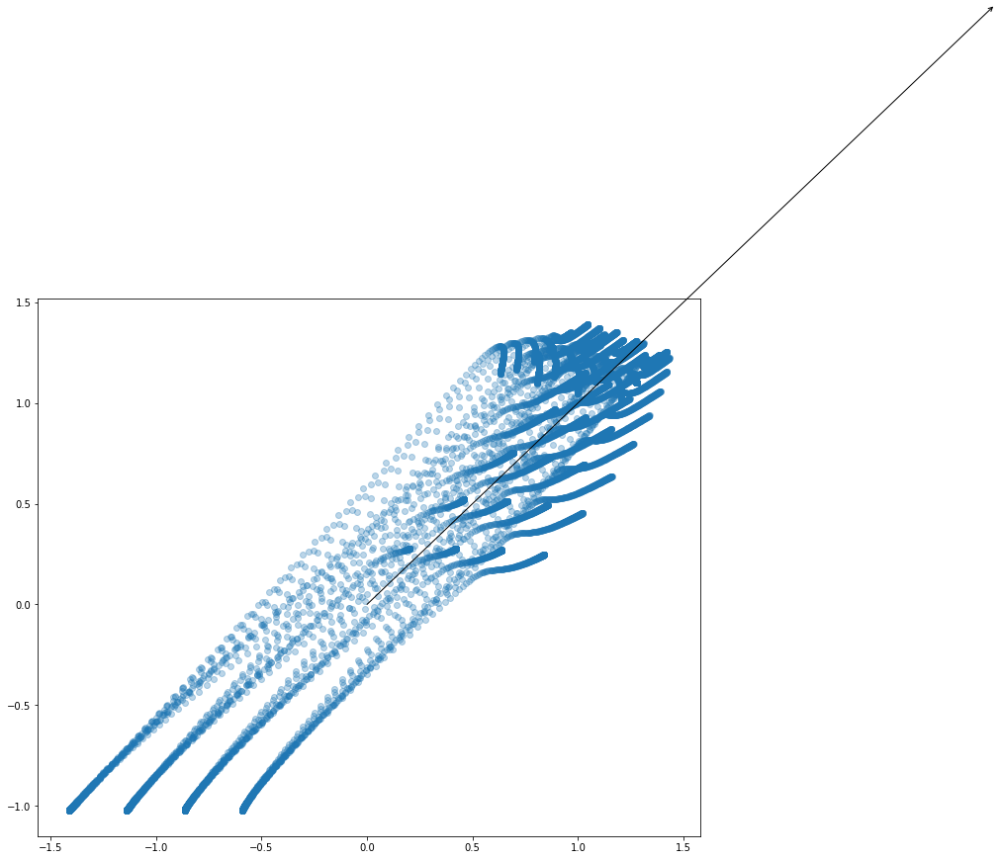

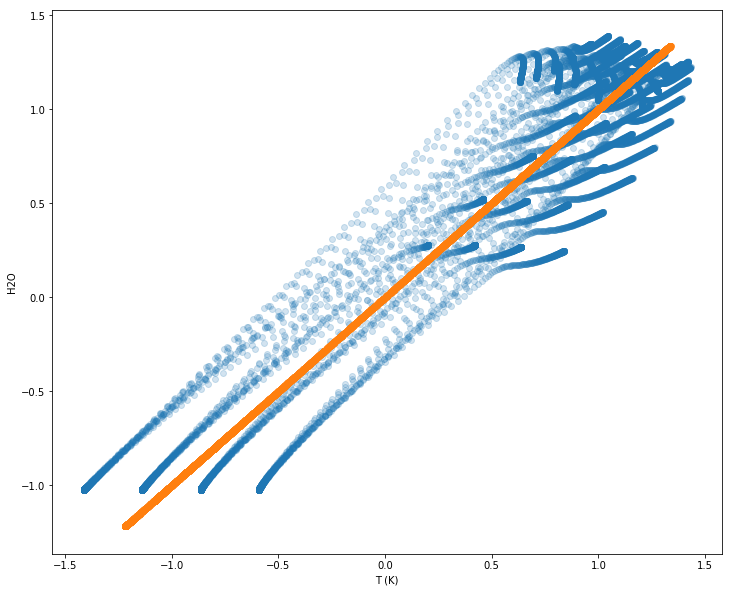

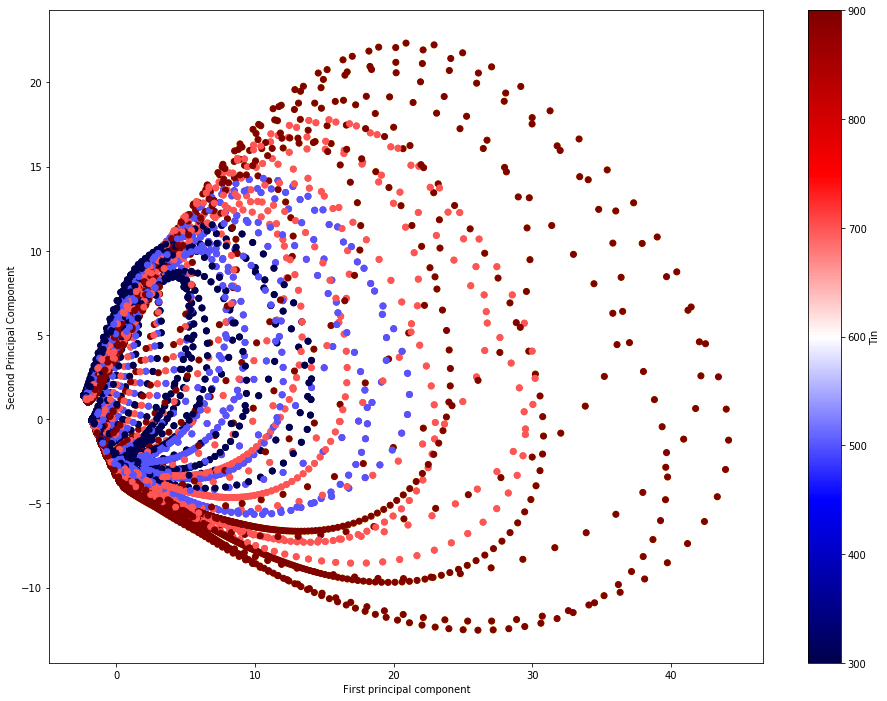

In [3]:
import import_ipynb
import Exploratory_Data_Analysis as eda
#import Local_PCA as lpca

- [Introduction](#Introduction)
    - [Scaling](#Scaling )
       - [Standardization Scaling](#Standardization-Scaling)
       - [Pareto Scaling](#Pareto-Scaling)
       - [Range Scaling](#Range-Scaling)
       - [Vast Scaling](#Vast-Scaling)
- [Original data](#Original-data)
    
- [PCA and Dimensionality Reduction](#PCA-and-Dimensionality-Reduction)


 

# Introduction

Overview of the pretreatment methods used in this study. Different methods of scaling will be implimented and the PCA will be done for each scalling methods.

# Scaling

Making sure that each Feature has approximately the same scale can be a crucial preprocessing step. In this section, 4 methods for scaling data will be studed and discussed. 

The table below summarises those methods:


![title](scaling.png)





Where $\mathbf{\bar{x}}$ is the mean (average) and $\mathbf{s_{i}}$ is the standard deviation from the mean; given by the following equations:

${\bar{x}} = \sum\limits_{i=1}^N x_{i}.$  

$s_{i} = \sqrt{\frac{1}{N-1}\sum_{i=1}^{N}\left(  x_{ij}-\bar{x}_i \right)^2}.$

In the Unit column, the unit of the data after the data pretreatment is stated. O represents the original Unit, and (-) presents dimensionless data. 

###  Standardization Scaling

When data contains outliers, StandardScaler can often be mislead. In such cases, it is better to use a scaler that is robust against outliers.
The result of standardization (or Z-score normalization) is that the features will be rescaled so that they’ll have the properties of a standard normal distribution with:

${\bar{x_{i}}}$=0 and ${s_{i}}$=1.


The standard scores (also called z scores) of the samples are calculated as follows:

${z_{ij}} = \frac{{x_{ij}}-{\bar{x_{i}}}}{{s_{i}}}$

If data is not normally distributed, this is not the best scaler to use.


In [4]:
class My_StandardScaler():
    
    """
    Standardize features by removing 
    the mean and scaling to unit variance
    """

           
    
    def __init__(self):
        return None
    
    def transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)  
        m = np.median(sd[sd > 0])   # replace the zero values  
        sd[sd == 0] = m             # by the median
        Z = X/sd
        return Z
        
    
    def fit_transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        m = np.median(sd[sd > 0])   # replace the zero                                        
        sd[sd == 0] = m             # values by the median 
        X_mean = X.mean(axis=0)
        X_center = X-X_mean        
        Z = X_center/sd
        return Z


###  Pareto Scaling
Pareto scaling method is similar to autoscaling 


The standard scores of the features are calculated as follows:

${z_{ij}} = \frac{{x_{ij}}-{\bar{x_{i}}}}{\sqrt{{s_{i}}}}$

In [5]:
class ParetoScaler():
    
    def __init__(self):
        return None
    
    def transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        m = np.median(sd[sd > 0])        
        sd[sd == 0] = m
        Z = X/np.sqrt(sd)
        return Z
            
    def fit_transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        m = np.median(sd[sd > 0])        
        sd[sd == 0] = m
        X_mean = X.mean(axis=0)
        X_center = X-X_mean
        Z = X_center/np.sqrt(sd)
        return Z
    

###  Range Scaling

is scaling features to lie between a given minimum and maximum value.

The standard scores of the features are calculated as follows:

${z_{ij}} = \frac{{x_{ij}}-{\bar{x_{i}}}}{{x_{i_{max}}}-{{x_{i_{min}}}}}$

In [6]:
class RangeScaler():
    def __init__(self):
        return None

    def transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        Z = X/(np.max(X, axis=0)-np.min(X, axis=0))
        return Z
    
    def fit_transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        X_mean = X.mean(axis=0)
        X_center = X-X_mean
        Z = X_center/(np.max(X, axis=0)-np.min(X, axis=0))
        return Z
    
    

###  Vast Scaling

The standard scores of the features are calculated as follows:

${z_{ij}} = \frac{{x_{ij}}-{\bar{x_{i}}}}{{s_{i}}} \cdot \frac{{\bar{x_{i}}}}{{s_{i}}}$

In [7]:
class VastScaler():
    def __init__(self):
        return None
        
    def transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        m = np.median(sd[sd > 0])        
        sd[sd == 0] = m
        Z = (X/sd)*(X_mean/sd)
        return Z
    
    def fit_transform(self, X):
        """Centring and Scaling the features of X"""
        X = np.asarray(X)
        X = np.float64(X)
        sd = np.std(X, axis=0)
        m = np.median(sd[sd > 0])        
        sd[sd == 0] = m
        X_mean = X.mean(axis=0)
        X_center = X-X_mean
        Z = (X_center/sd)*(X_mean/sd)
        return Z
    


# Original data

First we will start with original data, taking as example 2 variables and see the diffrence afetr the scaling.
Each transformation is plotted showing two transformed features. A specific pre-processing can be very beneficial depending of the application. In the following, we present some insights and behaviors of those pre-processing methods in the presence of marginal outliers(noise).


In [8]:
plt.figure(figsize=(12,6));
plt.plot(eda.df['T (K)'], eda.df['H2O']);
plt.xlabel('T (K)')
plt.ylabel('H2O')
plt.title('Unscaled data')
plt.close()



### StandardScaler

In [9]:
sd_scaler = My_StandardScaler()

In [10]:
X = eda.df



In [11]:
##X_sd_scaled = sd_scaler.transform(X_sd_mean)
X_sd_scaled = sd_scaler.fit_transform(X)
X_sd_scaled_without_centring = sd_scaler.transform(X)
#X.mean(axis=0)
#X_sd_scaled[np.isinf(X_sd_scaled)] = 0
#np.nan_to_num(X_sd_scaled[3])
#np.isinf(X_sd_scaled) == 0
#print(X_sd_scaled[3])
#np.isinf(X_sd_scaled[3])
#X_sd_scaled_without_centring[np.isinf(X_sd_scaled_without_centring)] = 1
#np.isinf(X_sd_scaled_without_centring[3])
#print(X_sd_scaled[0])
#print(X_sd_scaled_without_centring[0])


In [12]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(20, 12))
ax1.set_title('Before Scaling')
ax1.plot(eda.df['T (K)'], eda.df['H2O']);
ax1.set_xlabel('T (K)')
ax1.set_ylabel('H2O')

ax2.set_title('After Standard Scaler')
ax2.plot(X_sd_scaled[:,[1]], X_sd_scaled[:,[7]])
ax2.set_xlabel('T (K)')
ax2.set_ylabel('H2O')


ax3.set_title('After Standard Scaler without centring')
ax3.plot(X_sd_scaled_without_centring[:,[1]], X_sd_scaled_without_centring[:,[7]])
ax3.set_xlabel('T (K)')
ax3.set_ylabel('H2O')
plt.close()



fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))
ax1.set_title('Before Scaling')
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H2O'], ax=ax1)
#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Standard Scaler')
sns.kdeplot(eda.scaler_data[:,2], ax=ax2, label='H2')
sns.kdeplot(eda.scaler_data[:,7], ax=ax2, label='H2O')
#sns.kdeplot(scaled_df['x3'], ax=ax2)
plt.show()

In [13]:
pareto_scaler = ParetoScaler()
X_pareto_scaled = pareto_scaler.fit_transform(X)
X_pareto_scaled_without_centring = pareto_scaler.transform(X)
X_pareto_scaled_without_centring;

In [14]:
X_pareto_scaled
X_pareto_scaled[:,[1]]
X_pareto_scaled[:,[7]]
print(X_pareto_scaled[:,[7]].shape)
print(X_pareto_scaled[:,[1]].shape)

(26000, 1)
(26000, 1)


In [15]:
plt.figure(figsize=(12,6));
plt.plot(X_pareto_scaled[:,[1]], X_pareto_scaled[:,[7]])
plt.xlabel('T (K)')
plt.ylabel('H2O')
plt.title('ParetoScaled data')
plt.close()



In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(20, 12))
ax1.set_title('Before Scaling')
ax1.plot(eda.df['T (K)'], eda.df['H2O']);
ax1.set_xlabel('T (K)')
ax1.set_ylabel('H2O')

ax2.set_title('After Pareto Scaler')
ax2.plot(X_pareto_scaled[:,[1]], X_pareto_scaled[:,[7]])
ax2.set_xlabel('T (K)')
ax2.set_ylabel('H2O')


ax3.set_title('After Pareto Scaler without centring')
ax3.plot(X_pareto_scaled_without_centring[:,[1]], X_pareto_scaled_without_centring[:,[7]])
ax3.set_xlabel('T (K)')
ax3.set_ylabel('H2O')
plt.close()


In [17]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))
ax1.set_title('Before Scaling')
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H2O'], ax=ax1)
#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Pareto Scaler')
sns.kdeplot(X_pareto_scaled[:,2], ax=ax2, label='H2')
sns.kdeplot(X_pareto_scaled[:,7], ax=ax2, label='H2O')
#sns.kdeplot(scaled_df['x3'], ax=ax2)
plt.close()


In [18]:
range_scaler = RangeScaler()

In [19]:

X_range_scaled = range_scaler.fit_transform(X)
X_range_scaled_without_centring = range_scaler.transform(X)


In [20]:
plt.figure(figsize=(12,6));
plt.plot(X_range_scaled[:,[1]], X_range_scaled[:,[7]])
plt.xlabel('T (k)')
plt.ylabel('H2O')
plt.title('RangeScaled data')
plt.close()

RangeScaler rescales the data set such that all feature values are in the range [0, 1] as shown in the graph below. this scaling compress all inliers in the narrow range [-0.25, 0.0] for the transformed number of H2.

As StandardScaler, RangeScaler is very sensitive to the presence of outliers(noise).

In [21]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))
ax1.set_title('Before Scaling')
ax1.set_xlabel('Samples')
ax1.set_ylabel('Kde')
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H2O'], ax=ax1)
#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Range Scaler')
sns.kdeplot(X_range_scaled[:,2], ax=ax2, label='H2')
sns.kdeplot(X_range_scaled[:,7], ax=ax2, label='H2O')
#sns.kdeplot(scaled_df['x3'], ax=ax2)
plt.close()

In [22]:
vast_scaler = VastScaler()
X_vast_scaled = vast_scaler.fit_transform(X)

In [23]:
plt.figure(figsize=(12,6));
plt.plot(X_vast_scaled[:,[1]], X_vast_scaled[:,[7]])
plt.xlabel('T (K)')
plt.ylabel('H2O')
plt.title('VastScaled data')
plt.close()

In [24]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))
ax1.set_title('Before Scaling')
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H2O'], ax=ax1)
#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Vast Scaler')
sns.kdeplot(X_vast_scaled[:,2], ax=ax2, label='H2')
sns.kdeplot(X_vast_scaled[:,7], ax=ax2, label='H2O')
#sns.kdeplot(scaled_df['x3'], ax=ax2)
plt.close()

In [25]:
fig, ((ax1, ax2), (ax3, ax4),(ax5, ax6)) = plt.subplots(nrows=3, ncols=2, figsize=(28, 18))
ax1.set_title('Before Scaling')
#sns.kdeplot(eda.df['u (m/s)'], ax=ax1)
ax1.plot(eda.df['T (K)'], eda.df['H2O']);
ax1.set_xlabel('T (K)')
ax1.set_ylabel('H2O')


#sns.kdeplot(eda.df['OH'], ax=ax1)
#sns.kdeplot(eda.df['H2O'], ax=ax1)
#sns.kdeplot(eda.df['HO2'], ax=ax1)
#sns.kdeplot(eda.df['H2O2'], ax=ax1)

#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Standard Scaler')
ax2.plot(X_sd_scaled[:,[1]], X_sd_scaled[:,[7]])
ax2.set_xlabel('T (K)')
ax2.set_ylabel('H2O')



ax3.set_title('After Pareto Scaler')
ax3.plot(X_pareto_scaled[:,[1]], X_pareto_scaled[:,[7]])
ax3.set_xlabel('T (K)')
ax3.set_ylabel('H2O')


ax4.set_title('After Range Scaler')
ax4.plot(X_range_scaled[:,[1]], X_range_scaled[:,[7]])
ax4.set_xlabel('T (K)')
ax4.set_ylabel('H2O')


ax5.set_title('After Vast Scaler')
ax5.plot(X_vast_scaled[:,[1]], X_vast_scaled[:,[7]])
ax5.set_xlabel('T (K)')
ax5.set_ylabel('H2O')

#sns.kdeplot(scaled_df['x3'], ax=ax2)
plt.close()

In [26]:
import matplotlib
#matplotlib.style.use('ggplot')
fig, ((ax1, ax2), (ax3, ax4),(ax5,ax6)) = plt.subplots(nrows=3, ncols=2, figsize=(28, 18))
ax1.set_title('Before Scaling')
sns.kdeplot(eda.df['u (m/s)'], ax=ax1)
sns.kdeplot(eda.df['T (K)'], ax=ax1)
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H'], ax=ax1)
sns.kdeplot(eda.df['O'], ax=ax1)
sns.kdeplot(eda.df['O2'], ax=ax1)
sns.kdeplot(eda.df['OH'], ax=ax1)
sns.kdeplot(eda.df['H2O'], ax=ax1)
sns.kdeplot(eda.df['HO2'], ax=ax1)
sns.kdeplot(eda.df['H2O2'], ax=ax1)

#sns.kdeplot(df['x3'], ax=ax1)

ax2.set_title('After Standard Scaler')
sns.kdeplot(X_sd_scaled[:,0], ax=ax2)
sns.kdeplot(X_sd_scaled[:,1], ax=ax2)
sns.kdeplot(X_sd_scaled[:,2], ax=ax2)
sns.kdeplot(X_sd_scaled[:,3], ax=ax2)
sns.kdeplot(X_sd_scaled[:,4], ax=ax2)
sns.kdeplot(X_sd_scaled[:,5], ax=ax2)
sns.kdeplot(X_sd_scaled[:,6], ax=ax2)
sns.kdeplot(X_sd_scaled[:,7], ax=ax2)
sns.kdeplot(X_sd_scaled[:,8], ax=ax2)
sns.kdeplot(X_sd_scaled[:,9], ax=ax2)

ax3.set_title('After Pareto Scaler')
sns.kdeplot(X_pareto_scaled[:,0], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,1], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,2], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,3], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,4], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,5], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,6], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,7], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,8], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,9], ax=ax3)

ax4.set_title('After Range Scaler')
sns.kdeplot(X_range_scaled[:,0], ax=ax4)
sns.kdeplot(X_range_scaled[:,1], ax=ax4)
sns.kdeplot(X_range_scaled[:,2], ax=ax4)
sns.kdeplot(X_range_scaled[:,3], ax=ax4)
sns.kdeplot(X_range_scaled[:,4], ax=ax4)
sns.kdeplot(X_range_scaled[:,5], ax=ax4)
sns.kdeplot(X_range_scaled[:,6], ax=ax4)
sns.kdeplot(X_range_scaled[:,7], ax=ax4)
sns.kdeplot(X_range_scaled[:,8], ax=ax4)
sns.kdeplot(X_range_scaled[:,9], ax=ax4)


ax5.set_title('After Vast Scaler')
sns.kdeplot(X_vast_scaled[:,0], ax=ax5)
sns.kdeplot(X_vast_scaled[:,1], ax=ax5)
sns.kdeplot(X_vast_scaled[:,2], ax=ax5)
sns.kdeplot(X_vast_scaled[:,3], ax=ax5)
sns.kdeplot(X_vast_scaled[:,4], ax=ax5)
sns.kdeplot(X_vast_scaled[:,5], ax=ax5)
sns.kdeplot(X_vast_scaled[:,6], ax=ax5)
sns.kdeplot(X_vast_scaled[:,7], ax=ax5)
sns.kdeplot(X_vast_scaled[:,8], ax=ax5)
sns.kdeplot(X_vast_scaled[:,9], ax=ax5)
plt.close()


In [27]:
fig, ((ax1, ax2), (ax3, ax4),(ax5,ax6)) = plt.subplots(nrows=3, ncols=2, figsize=(28, 18))
ax1.set_title('Before Scaling')
sns.kdeplot(eda.df['T (K)'], ax=ax1)
sns.kdeplot(eda.df['H2'], ax=ax1)
sns.kdeplot(eda.df['H'], ax=ax1)
sns.kdeplot(eda.df['O'], ax=ax1)
sns.kdeplot(eda.df['O2'], ax=ax1)



ax2.set_title('After Standard Scaler')
sns.kdeplot(X_sd_scaled[:,0], ax=ax2)
sns.kdeplot(X_sd_scaled[:,1], ax=ax2)
sns.kdeplot(X_sd_scaled[:,2], ax=ax2)
sns.kdeplot(X_sd_scaled[:,3], ax=ax2)
sns.kdeplot(X_sd_scaled[:,4], ax=ax2)


ax3.set_title('After Pareto Scaler')
sns.kdeplot(X_pareto_scaled[:,0], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,1], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,2], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,3], ax=ax3)
sns.kdeplot(X_pareto_scaled[:,4], ax=ax3)

ax4.set_title('After Range Scaler')
sns.kdeplot(X_range_scaled[:,0], ax=ax4)
sns.kdeplot(X_range_scaled[:,1], ax=ax4)
sns.kdeplot(X_range_scaled[:,2], ax=ax4)
sns.kdeplot(X_range_scaled[:,3], ax=ax4)
sns.kdeplot(X_range_scaled[:,4], ax=ax4)


ax5.set_title('After Vast Scaler')
sns.kdeplot(X_vast_scaled[:,0], ax=ax5)
sns.kdeplot(X_vast_scaled[:,1], ax=ax5)
sns.kdeplot(X_vast_scaled[:,2], ax=ax5)
sns.kdeplot(X_vast_scaled[:,3], ax=ax5)
sns.kdeplot(X_vast_scaled[:,4], ax=ax5)

plt.close()

## PCA

### PCA with StandardScaler scaling

In [28]:
pca_sd = PCA(n_components=None)
pca_sd.fit(X_sd_scaled)
x_pca_sd = pca_sd.transform(X_sd_scaled)
pca_sd_without_centring = PCA(n_components=None, svd_solver='randomized')
pca_sd_without_centring.fit(X_sd_scaled_without_centring)
x_pca_sd_without_centring = pca_sd_without_centring.transform(X_sd_scaled_without_centring)
x_pca_sd_without_centring;


In [29]:
pca_sd.explained_variance_ratio_
pca_sd.explained_variance_ratio_[0:10].sum()

0.9146989769433306

In [30]:
pca_sd_without_centring.explained_variance_ratio_
pca_sd_without_centring.explained_variance_ratio_[0:10].sum()

0.9146989769433299

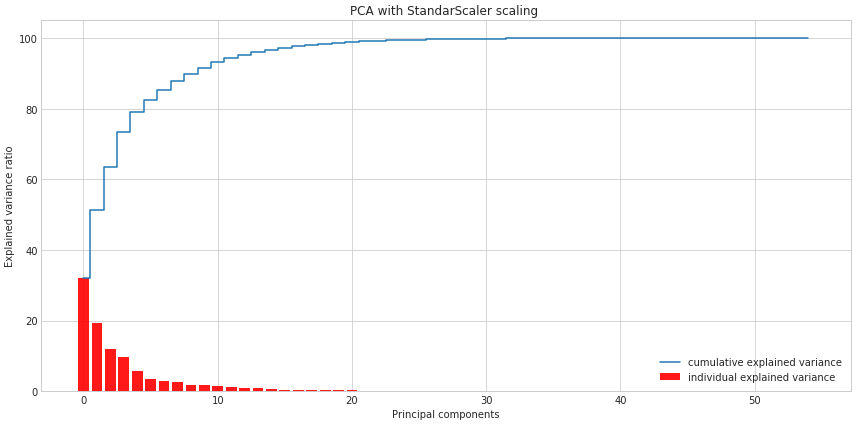

In [31]:
cum_var_exp_sd = np.cumsum(pca_sd.explained_variance_ratio_)*100
var_exp_sd = pca_sd.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12, 6))

    plt.bar(range(55), var_exp_sd, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    plt.step(range(55), cum_var_exp_sd, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.title('PCA with StandarScaler scaling ')
    plt.legend(loc='best')
    plt.tight_layout()
    #plt.close()
    


In [32]:
cum_var_exp_sd = np.cumsum(pca_sd.explained_variance_ratio_)*100
var_exp_sd = pca_sd.explained_variance_ratio_*100

cum_var_exp_sd_without_centring = np.cumsum(pca_sd_without_centring.explained_variance_ratio_)*100
var_exp_sd_without_centring = pca_sd_without_centring.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))    
    ax1.set_title('With Centring and Scaling')
    ax1.bar(range(55), var_exp_sd, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax1.step(range(55), cum_var_exp_sd, where='mid',
             label='cumulative explained variance')
    ax1.set_ylabel('Explained variance ratio')
    ax1.set_xlabel('Principal components')
    ax1.legend(loc='best')
    
    ax2.set_title('Without Centring')
    ax2.bar(range(55), var_exp_sd_without_centring, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax2.step(range(55), cum_var_exp_sd_without_centring, where='mid',
             label='cumulative explained variance')
    ax2.set_ylabel('Explained variance ratio')
    ax2.set_xlabel('Principal components')
    ax2.legend(loc='best')
    plt.close()



Observe:

The scikit-learn implementations of PCA ( sklearn.decomposition.PCA) and PLS algorithms (sklearn.cross_decomposition._PLS objects, exemplified with PLSRegression) automatically perform mean centering as part of their fit method.

#### PCA with Pareto scaling

In [33]:
pca_pareto = PCA(n_components=None)

pca_pareto.fit(X_pareto_scaled)

x_pca_pareto = pca_pareto.transform(X_pareto_scaled)

In [34]:
pca_pareto.explained_variance_ratio_;

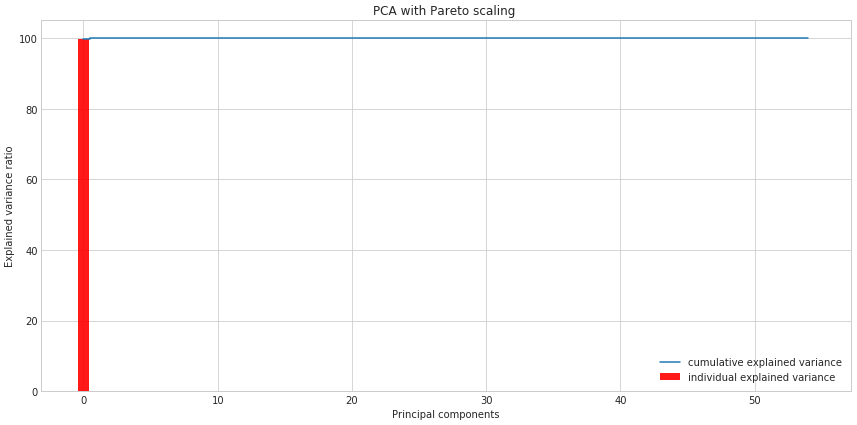

In [35]:
cum_var_exp_pareto = np.cumsum(pca_pareto.explained_variance_ratio_)*100
var_exp_pareto = pca_pareto.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12, 6))

    plt.bar(range(55), var_exp_pareto, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    plt.step(range(55), cum_var_exp_pareto, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.title('PCA with Pareto scaling ')
    plt.legend(loc='best')
    plt.tight_layout()
    #plt.close()

### PCA with Range scaling

In [36]:
pca_range = PCA(n_components=None)

pca_range.fit(X_range_scaled)

x_pca_range = pca_range.transform(X_range_scaled)

In [37]:
pca_range.explained_variance_ratio_;

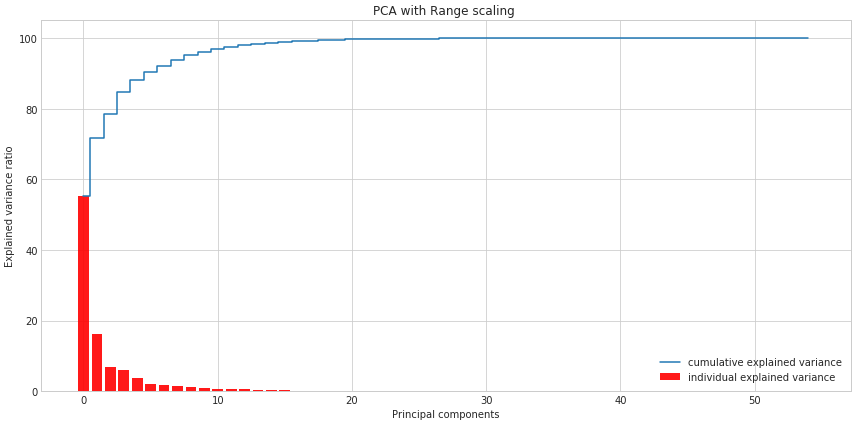

In [38]:
cum_var_exp_range = np.cumsum(pca_range.explained_variance_ratio_)*100
var_exp_range = pca_range.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12, 6))

    plt.bar(range(55), var_exp_range, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    plt.step(range(55), cum_var_exp_range, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.title('PCA with Range scaling ')
    plt.legend(loc='best')
    plt.tight_layout()
    #plt.close()

### PCA with Vast scaling

In [39]:
pca_vast = PCA(n_components=None)

pca_vast.fit(X_vast_scaled)

x_pca_vast = pca_vast.transform(X_vast_scaled)

In [40]:
pca_vast.explained_variance_ratio_;

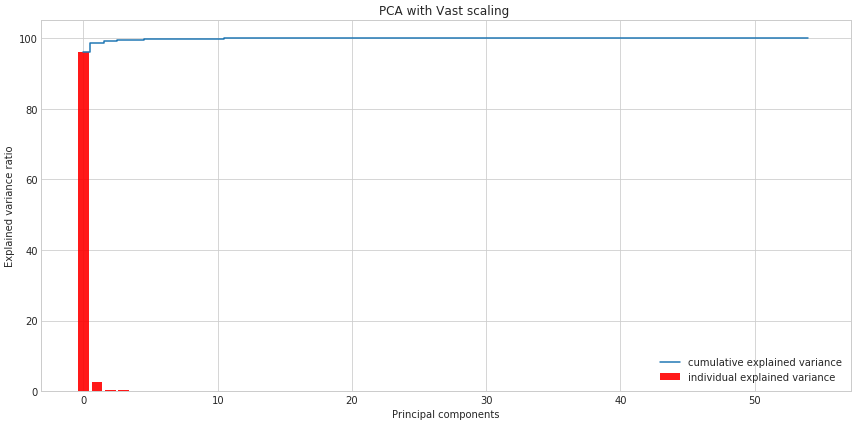

In [41]:
cum_var_exp_vast = np.cumsum(pca_vast.explained_variance_ratio_)*100
var_exp_vast = pca_vast.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(12, 6))

    plt.bar(range(55), var_exp_vast, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    plt.step(range(55), cum_var_exp_vast, where='mid',
             label='cumulative explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.title('PCA with Vast scaling ')
    plt.legend(loc='best')
    plt.tight_layout()
    #plt.close()

## PCA without scaling and without centring


Another interesting thing to do is to create those scatter plots PC1 vs PC2 (vs PC3) and color them with columns of the data matrix that you did not use. As you remember, the original data matrix had additional columns, which you did not consider for the analysis. One of this columns has the label "Tin".
Then, you can try to do PCA without centering the data (but still scaling), then do the same scatter plots, colored by Tin.
In both cases, you will see something interesting. 

I've attached an example of what it could look like. For the pic with Y0, the data were centered and then auto-scaled. For the one with Y1, data were not centered but auto-scaled (if I remember correctly).
The interesting thing is that, even if only 2 components are not enough (things work better if you do a 3D scatter plot with 3 components), flames/data that were produced for different values of this parameter "Tin" can somehow be identified/discriminated.

This means that, for an unseen set of data, one could project the data onto the already-found principal components and by checking where these data would fall in the pc-space, one would be able to classify them (perhaps predict the value of the parameter Tin that produced them).

In [42]:
pca_sd_without_scaling = PCA(n_components=None)
pca_sd_without_scaling.fit(X)
x_pca_sd_without_scaling = pca_sd_without_scaling.transform(X)
pca_sd_without_centring = PCA(n_components=None)
pca_sd_without_centring.fit(X_sd_scaled_without_centring)
x_pca_sd_without_centring = pca_sd_without_centring.transform(X_sd_scaled_without_centring)


In [43]:
cum_var_exp_sd_without_scaling = np.cumsum(pca_sd_without_scaling.explained_variance_ratio_)*100
var_exp_sd_without_scaling = pca_sd_without_scaling.explained_variance_ratio_*100

cum_var_exp_sd_without_centring = np.cumsum(pca_sd_without_centring.explained_variance_ratio_)*100
var_exp_sd_without_centring = pca_sd_without_centring.explained_variance_ratio_*100
with plt.style.context('seaborn-whitegrid'):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))    
    ax1.set_title('Without Scaling')
    ax1.bar(range(55), var_exp_sd_without_scaling, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax1.step(range(55), cum_var_exp_sd_without_scaling, where='mid',
             label='cumulative explained variance')
    ax1.set_ylabel('Explained variance ratio')
    ax1.set_xlabel('Principal components')
    ax1.legend(loc='best')
    
    ax2.set_title('Without centring')
    ax2.bar(range(55), var_exp_sd_without_centring, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax2.step(range(55), cum_var_exp_sd_without_centring, where='mid',
             label='cumulative explained variance')
    ax2.set_ylabel('Explained variance ratio')
    ax2.set_xlabel('Principal components')
    ax2.legend(loc='best')
plt.close()

Observe:
Sometimes one variable has a scale very different from the other (a concentration of 100-1000mg versus 0,01-0,1mg). When we want to test the influence of these variables on a chemical process, the variable with the highest numerical value will have more weight in the model simply because its numerical value is greater. We can rescale all the variables to range between 0 and 1, changing the variable's values, but keeping the same proportion between each value. Now, all variables will have the same potential weight to PCA. This procedure is called "ranging" and to achieve it we divide each variable by the largest value that variable has in the dataset.


In [44]:
plt.figure(figsize=(12,6))
plt.scatter(x_pca_sd[:,0], x_pca_sd[:,1],c=eda.target,cmap='plasma')
surf = plt.scatter(x_pca_sd[:,0],x_pca_sd[:,1],c=eda.target,cmap='seismic')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA with StandardScaler scaling')
plt.colorbar(surf, label='Tin')
plt.close()

In [45]:
plt.figure(figsize=(12,6))
plt.scatter(x_pca_sd_without_centring[:,0], x_pca_sd_without_centring[:,1],c=eda.target,cmap='plasma')
surf = plt.scatter(x_pca_sd_without_centring[:,0],x_pca_sd_without_centring[:,1],c=eda.target,cmap='seismic')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA without centring')
plt.colorbar(surf, label='Tin')
plt.close()

In [46]:
plt.figure(figsize=(12,6))
plt.scatter(x_pca_sd_without_scaling[:,0], x_pca_sd_without_scaling[:,1],c=eda.target,cmap='plasma')
surf = plt.scatter(x_pca_sd_without_scaling[:,0],x_pca_sd_without_scaling[:,1],c=eda.target,cmap='seismic')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')
plt.title('PCA without centring and scaling')
plt.colorbar(surf, label='Tin')
plt.close()

In [47]:
from mpl_toolkits.mplot3d import Axes3D
from IPython.html.widgets import interactive, fixed
fig = plt.figure(figsize=(20,12))
ax = plt.axes(projection='3d')
interactive(ax.scatter3D(x_pca_sd[:,0], x_pca_sd[:,1], x_pca_sd[:,2], c=eda.target, cmap='seismic'));
ax.set_xlabel('PC_1')
ax.set_ylabel('PC_2')
ax.set_zlabel('PC_3')
fig.colorbar(surf,label='Tin')
plt.close()


C:\Users\azarguit\Anaconda3\lib\site-packages\IPython\html.py:14: ShimWarning:

The `IPython.html` package has been deprecated since IPython 4.0. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.



Observe:
        mapplotlib is not specifically designed to be a super great three dimensional visualization
        library.
        New plotting library is needed to make 3D plots more interactif: Plotly
        

### SVD

https://blog.applied.ai/feature-reduction-using-svd/

https://medium.com/@zhang_yang/python-code-examples-of-pca-v-s-svd-4e9861db0a71

https://stats.stackexchange.com/questions/189822/how-does-centering-make-a-difference-in-pca-for-svd-and-eigen-decomposition

https://blog.applied.ai/visualising-high-dimensional-data/

In order to compare centrated data with non centrated one we need to get PCs based on SVD insteed of covararaince.
For these, we could use TruncatedSVD object that is elready included in sklearn librarie.

In [48]:
from numpy.linalg import svd
from sklearn.decomposition import TruncatedSVD

from scipy.sparse.linalg import svds
from numpy.linalg import svd


In [49]:
u, s, vt = svds(X_sd_scaled_without_centring, 54)

In [50]:
pc = u @ np.diag(s)
pc = pc[:,::-1]

In [51]:
explained_variance = np.var(pc, axis=0)
full_variance = np.var(X_sd_scaled_without_centring, axis=0)
explained_variance_ratio = explained_variance / full_variance.sum()

explained_variance_ratio.cumsum()

ax = pd.Series(np.sort(explained_variance_ratio)[::-1]).plot(
                    kind='bar', figsize=(10,4)).set_ylim([0,1])

plt.close()
np.sort(explained_variance_ratio)[::-1]


array([3.20937306e-01, 1.92788361e-01, 1.20863011e-01, 9.21510772e-02,
       5.67741646e-02, 3.22436632e-02, 2.76115782e-02, 2.60829501e-02,
       1.80027972e-02, 1.70377228e-02, 1.63181850e-02, 1.24180391e-02,
       1.20750269e-02, 1.00151471e-02, 8.17522307e-03, 5.16567822e-03,
       4.65269563e-03, 3.71977548e-03, 3.40300708e-03, 3.14206594e-03,
       2.91273639e-03, 2.48695863e-03, 2.04129314e-03, 1.95008469e-03,
       1.27704870e-03, 9.27736182e-04, 8.44864969e-04, 6.87921578e-04,
       6.73727461e-04, 6.26834351e-04, 3.28847281e-04, 2.82680143e-04,
       2.26866672e-04, 1.90043374e-04, 1.57867707e-04, 1.39055325e-04,
       1.23297882e-04, 1.03574356e-04, 8.78680129e-05, 7.69438444e-05,
       7.39230651e-05, 5.30419027e-05, 3.90583859e-05, 2.52377228e-05,
       1.90242977e-05, 1.85089665e-05, 1.27644710e-05, 1.01012997e-05,
       7.14395590e-06, 5.33286341e-06, 4.20143415e-06, 3.11093747e-06,
       2.44628976e-06, 2.30629563e-06])

### StandardScaler: Centring and without centring

#### var_exp and cum_var_exp

In [52]:
ncomps = 10
#PCA with StandardScaler scaling: centring and scaling 
pca_sd = PCA(n_components=ncomps)
pca_sd.fit(X_sd_scaled)
x_pca_sd = pca_sd.transform(X_sd_scaled)

#PCA without both centring and scaling 
pca_sd_without_scaling = PCA(n_components=ncomps)
pca_sd_without_scaling.fit(X)
x_pca_sd_without_scaling = pca_sd_without_scaling.transform(X)

#PCA with StandardScaler scaling: without centring 
svd_sd_without_centring = TruncatedSVD(n_components=ncomps)
x_svd_sd_without_centring = svd_sd_without_centring.fit_transform(X_sd_scaled_without_centring)


var_exp_sd = pca_sd.explained_variance_ratio_
var_exp_sd_without_centring = svd_sd_without_centring.explained_variance_ratio_
var_exp_sd_without_scaling = pca_sd_without_scaling.explained_variance_ratio_
var_exp_sd, var_exp_sd_without_centring, var_exp_sd_without_scaling
#x_pca_sd, x_svd_sd_without_centring

(array([0.32101883, 0.19313005, 0.1211365 , 0.09755655, 0.05694861,
        0.03420165, 0.02889311, 0.02649538, 0.01800361, 0.01731468]),
 array([0.01241804, 0.32093731, 0.19278836, 0.12086301, 0.09215108,
        0.05677416, 0.03224366, 0.02761158, 0.02608295, 0.0180028 ]),
 array([9.99996206e-01, 3.78646627e-06, 4.88958667e-09, 1.52921381e-09,
        8.25451865e-10, 5.58505695e-11, 3.06099278e-11, 4.99801989e-12,
        2.73096742e-12, 1.07158455e-12]))

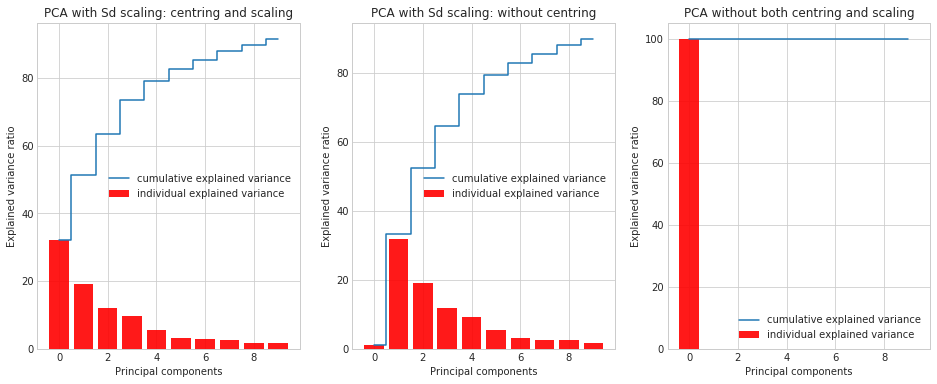

In [53]:
cum_var_exp_sd = np.cumsum(pca_sd.explained_variance_ratio_)*100
var_exp_sd = pca_sd.explained_variance_ratio_*100

cum_var_exp_sd_without_centring = np.cumsum(svd_sd_without_centring.explained_variance_ratio_)*100
var_exp_sd_without_centring = svd_sd_without_centring.explained_variance_ratio_*100

cum_var_exp_sd_without_scaling = np.cumsum(pca_sd_without_scaling.explained_variance_ratio_)*100
var_exp_sd_without_scaling = pca_sd_without_scaling.explained_variance_ratio_*100

with plt.style.context('seaborn-whitegrid'):
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))    
    ax1.set_title('PCA with Sd scaling: centring and scaling')
    ax1.bar(range(ncomps), var_exp_sd, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax1.step(range(ncomps), cum_var_exp_sd, where='mid',
             label='cumulative explained variance')
    ax1.set_ylabel('Explained variance ratio')
    ax1.set_xlabel('Principal components')
    ax1.legend(loc='best')
    
    ax2.set_title('PCA with Sd scaling: without centring')
    ax2.bar(range(ncomps), var_exp_sd_without_centring, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax2.step(range(ncomps), cum_var_exp_sd_without_centring, where='mid',
             label='cumulative explained variance')
    ax2.set_ylabel('Explained variance ratio')
    ax2.set_xlabel('Principal components')
    ax2.legend(loc='best')
    
    ax3.set_title('PCA without both centring and scaling')
    ax3.bar(range(ncomps), var_exp_sd_without_scaling, alpha=0.9, color='r', align='center',
            label='individual explained variance')
    #plt.bar.set_color('r')
    ax3.step(range(ncomps), cum_var_exp_sd_without_scaling, where='mid',
             label='cumulative explained variance')
    ax3.set_ylabel('Explained variance ratio')
    ax3.set_xlabel('Principal components')
    ax3.legend(loc='best')
#plt.show()
#plt.close()

#### Scatter plots for PCAs

##### PC1 vs PC2 

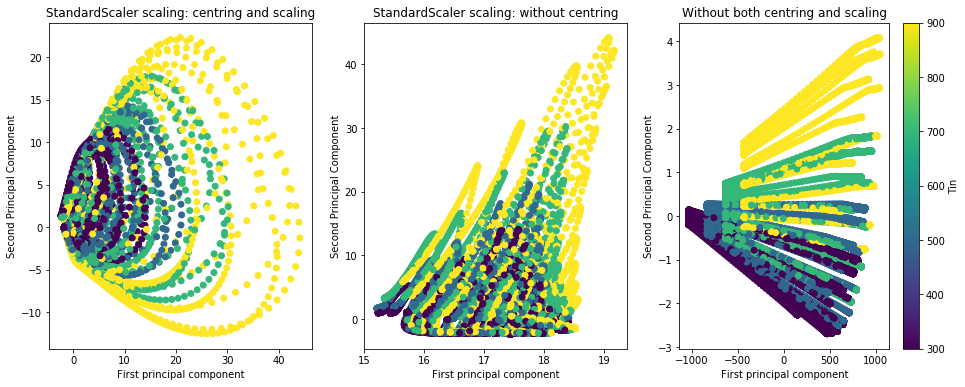

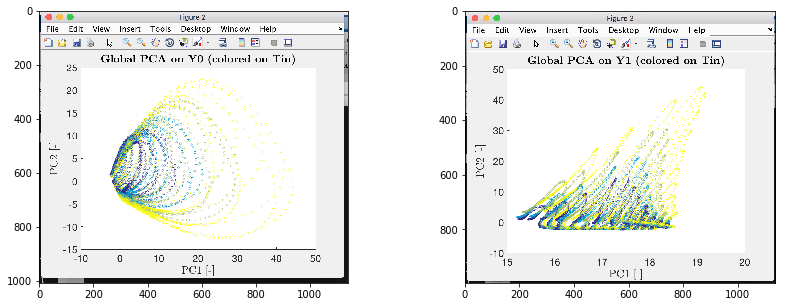

In [54]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))

surf1 = ax1.scatter(x_pca_sd[:,0],x_pca_sd[:,1],c=eda.target)
ax1.set_xlabel('First principal component')
ax1.set_ylabel('Second Principal Component')
ax1.set_title('StandardScaler scaling: centring and scaling')


surf2 = ax2.scatter(x_svd_sd_without_centring[:,0],x_svd_sd_without_centring[:,1],c=eda.target)
ax2.set_xlabel('First principal component')
ax2.set_ylabel('Second Principal Component')
ax2.set_title('StandardScaler scaling: without centring')


surf3 = ax3.scatter(x_pca_sd_without_scaling[:,0],x_pca_sd_without_scaling[:,1],c=eda.target)
ax3.set_xlabel('First principal component')
ax3.set_ylabel('Second Principal Component')
ax3.set_title('Without both centring and scaling')
fig.colorbar(surf3,label='Tin')
#plt.close()

fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 5))
Y_0 = mpimg.imread('Y0.png')
ax1.imshow(Y_0)
Y_1 = mpimg.imread('Y1.png')
ax2.imshow(Y_1)
#plt.close()



##### PC1 vs PC2 vs PC3

In [55]:
import plotly as py
import plotly.graph_objs as go
import ipywidgets as widgets
from scipy import special
from plotly.offline import init_notebook_mode, plot_mpl

py.offline.init_notebook_mode(connected=True)   # for offline mode use
eda.target.head()

0    500
1    900
2    500
3    300
4    900
Name: Tin, dtype: int64

In [56]:

trace = go.Scatter3d(
    x= x_pca_sd[:,0],
    y=x_pca_sd[:,1], 
    z=x_pca_sd[:,2],


    mode='markers',
    marker=dict(
        size=2,
        color=eda.target,
        colorbar=dict(
        title='Tin'
            ),
        colorscale='Viridis'
        
        ))


data = [trace]


layout = go.Layout(

    title='<b>PC1 vs PC2 vs PC3: StandardScaler with centring</b>',
    scene = dict(
    xaxis = dict(
        title='PC1'),
    yaxis = dict(
        title='PC2'),
    zaxis = dict(
        title='PC3'),
    
    ),
)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)


In [57]:
trace = go.Scatter3d(
    x=x_svd_sd_without_centring[:,1],
    y=x_svd_sd_without_centring[:,2], 
    z=x_svd_sd_without_centring[:,3],


    mode='markers',
    marker=dict(
        size=2,
        color=eda.target,
        colorbar=dict(
        title='Tin'
            ),
        colorscale='Viridis'
        
        ))


data = [trace]



layout = go.Layout(
    title='<b>PC1 vs PC2 vs PC3: StandardScaler without centring</b>',
    scene = dict(
    xaxis = dict(
        title='PC1'),
    yaxis = dict(
        title='PC2'),
    zaxis = dict(
        title='PC3'),
    
    ),
    


)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [58]:
trace = go.Scatter3d(
    x=x_pca_sd_without_scaling[:,0],
    y=x_pca_sd_without_scaling[:,1], 
    z=x_pca_sd_without_scaling[:,2],


    mode='markers',
    marker=dict(
        size=2,
        color=eda.target,
        colorbar=dict(
        title='Tin'
            ),
        colorscale='Viridis'
        
        ))


data = [trace]



layout = go.Layout(
    title='<b>PC1 vs PC2 vs PC3: Without scaling</b>',
    scene = dict(
    xaxis = dict(
        title='PC1'),
    yaxis = dict(
        title='PC2'),
    zaxis = dict(
        title='PC3'),
    
    ),
    


)

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

## Cluster analysis

In [168]:
from sklearn.cluster import KMeans
pca_test = PCA(n_components=10)
pca_test.fit(eda.scaler_data)
print(eda.scaler_data.shape)

PCs = pca_test.transform(eda.scaler_data)

# Let's create an instance for KMeans
kmeans = KMeans(n_clusters=4)
# Lets fit the model to our features (data[0])
kmeans.fit(PCs)

(26000, 55)


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [169]:
index_name = ['PC_'+str(k+1) for k in range(10)]
df_PCs = pd.DataFrame(np.round(PCs, 4).T, index=index_name).T
df_PCs.head()

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10
0,-2.1052,1.3201,2.2185,-0.0392,0.0763,-0.9955,0.0455,-0.1800,-0.1314,-0.0212
1,3.6532,-4.7530,-0.6310,-3.4504,1.6811,-1.7190,-0.2018,2.0161,-0.0452,0.9186
2,-1.5246,-0.3843,-0.5480,0.9516,-0.8682,2.5422,-1.2131,0.4833,-0.8500,1.0245
3,-1.7518,2.5342,0.7720,-0.2870,1.8466,2.1892,2.2800,-0.5070,-0.2870,-0.5718
4,0.4865,-3.9463,-4.9896,2.3479,0.5648,-1.8231,0.5643,-1.1397,0.1151,-1.8035


In [170]:
#sns.pairplot(df_PCs, size=3);

In [171]:
df_PCs_labels = pd.concat([df_PCs, eda.target], axis=1)

#sns.pairplot(df_PCs_labels, hue='Tin', vars=index_name, size=3);

In [172]:
df_labels = pd.DataFrame(kmeans.labels_, columns=['kmeans_idx'])
kmeans_labels = pd.concat([df_PCs, df_labels], axis=1)
kmeans_labels.head()

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,kmeans_idx
0,-2.1052,1.3201,2.2185,-0.0392,0.0763,-0.9955,0.0455,-0.1800,-0.1314,-0.0212,2
1,3.6532,-4.7530,-0.6310,-3.4504,1.6811,-1.7190,-0.2018,2.0161,-0.0452,0.9186,0
2,-1.5246,-0.3843,-0.5480,0.9516,-0.8682,2.5422,-1.2131,0.4833,-0.8500,1.0245,2
3,-1.7518,2.5342,0.7720,-0.2870,1.8466,2.1892,2.2800,-0.5070,-0.2870,-0.5718,2
4,0.4865,-3.9463,-4.9896,2.3479,0.5648,-1.8231,0.5643,-1.1397,0.1151,-1.8035,0


In [173]:
plt.figure(figsize=(12,8))
sns.countplot(data=kmeans_labels, x='kmeans_idx')
plt.title('counting idx')
plt.close()

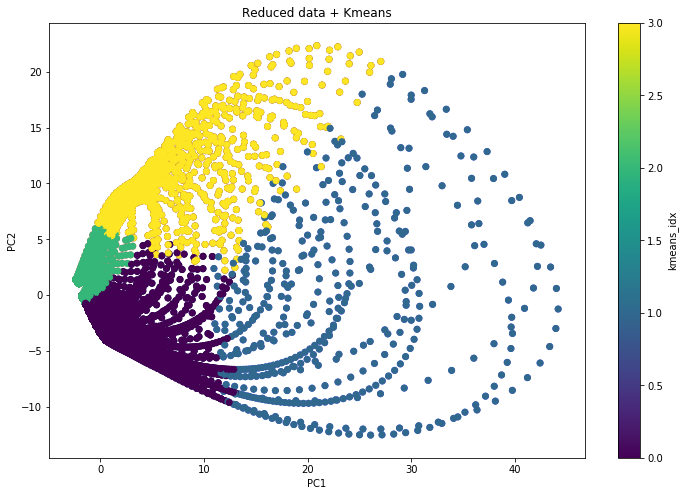

In [174]:
plt.figure(figsize=(12,8))
plt.scatter(x=kmeans_labels['PC_1'],y=kmeans_labels['PC_2'] ,c=kmeans_labels['kmeans_idx'],cmap='seismic')
surf=plt.scatter(x=kmeans_labels['PC_1'],y=kmeans_labels['PC_2'] ,c=kmeans_labels['kmeans_idx'])
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA + Kmeans')
plt.colorbar(surf, label='kmeans_idx')
#plt.close()

In [150]:
#sns.pairplot(kmeans_labels, hue='kmeans_idx', vars=index_name)

In [151]:
#kmeans_labels = kmeans_labels.iloc[:,0:10]

In [175]:
#kmeans_labels

In [176]:
# Let's create an instance for KMeans
kmeans = KMeans(n_clusters=10)
# Lets fit the model to our features (data[0])
kmeans.fit(eda.df)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [177]:
df_labels = pd.DataFrame(kmeans.labels_, columns=['kmeans_idx'])
kmeans_labels = pd.concat([eda.df, df_labels], axis=1)
kmeans_labels.head()

,u (m/s),T (K),H2,H,O,O2,OH,H2O,HO2,H2O2,...,HOCN,HNCO,NCO,N2,AR,C3H7,C3H8,CH2CHO,CH3CHO,kmeans_idx
0,0.242230,500.21,0.004240,2.773300e-15,4.230100e-17,0.179020,2.368200e-14,0.000045,9.828800e-09,4.671000e-09,...,8.257000e-15,4.236700e-12,8.082200e-16,0.67349,0.000000e+00,6.844500e-15,6.591800e-12,1.856100e-20,2.626300e-11,0
1,3.789800,2267.90,0.095451,3.115600e-03,1.830100e-05,0.000013,8.173000e-04,0.162760,7.675700e-09,2.838000e-09,...,3.553300e-08,8.744100e-07,1.556700e-08,0.60834,1.113100e-102,1.336600e-18,6.773100e-19,1.785200e-12,6.338300e-13,5
2,1.386100,1817.40,0.000089,1.263900e-05,1.308700e-04,0.078818,1.170300e-03,0.117940,1.066600e-06,5.883800e-08,...,3.848700e-15,8.454300e-13,3.425300e-14,0.74271,0.000000e+00,0.000000e+00,0.000000e+00,5.466100e-27,0.000000e+00,3
3,0.089593,554.13,0.000807,3.398100e-11,1.818100e-11,0.180600,3.219000e-09,0.027333,8.011000e-06,2.467200e-05,...,5.591500e-13,8.089500e-10,3.104600e-13,0.74618,5.923600e-100,9.898600e-12,1.623300e-07,1.007400e-12,5.323300e-07,0
4,8.021700,2287.00,0.023245,1.201100e-02,4.659300e-03,0.013655,1.313800e-02,0.160870,3.058900e-06,1.448200e-07,...,1.336000e-11,5.672600e-10,1.260700e-10,0.67396,0.000000e+00,1.686300e-35,2.575800e-37,2.939800e-20,5.992300e-20,5


In [178]:
from sklearn.preprocessing import StandardScaler
sd_scaler = StandardScaler()
X_sd_scaled_with_centring = sd_scaler.fit_transform(kmeans_labels.drop('kmeans_idx', axis=1))

In [179]:
pca_sd = PCA(n_components=None)
pca_sd.fit(X_sd_scaled_with_centring)
x_pca_sd = pca_sd.transform(X_sd_scaled_with_centring)

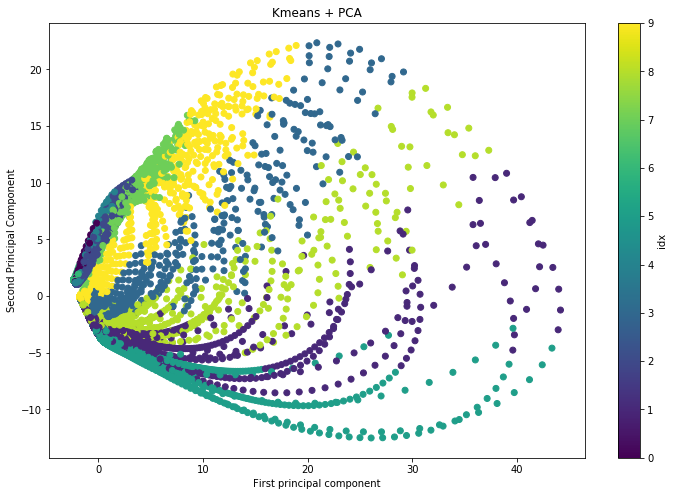

In [180]:
fig, (ax1) = plt.subplots(ncols=1, figsize=(12, 8))

surf1 = ax1.scatter(x_pca_sd[:,0],x_pca_sd[:,1],c=kmeans_labels['kmeans_idx'])
ax1.set_xlabel('First principal component')
ax1.set_ylabel('Second Principal Component')
ax1.set_title('Kmeans + PCA')
fig.colorbar(surf1,label='idx')